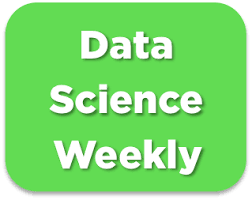

# Challenge : predict conversions 🏆🏆

This is the template that shows the different steps of the challenge. In this notebook, all the training/predictions steps are implemented for a very basic model (logistic regression with only one variable). Please use this template and feel free to change the preprocessing/training steps to get the model with the best f1-score ! May the force be with you 🧨🧨  

**For a detailed description of this project, please refer to *02-Conversion_rate_challenge.ipynb*.**

# Import libraries

In [1]:
import pandas as pd
import numpy as np

from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder
from sklearn.compose import ColumnTransformer

from sklearn.metrics import f1_score, confusion_matrix
#modules for model building
#algorithms for sampling
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler
from imblearn.over_sampling import SMOTE

#baseline linear model
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

#modules for hyper parameter tuning
from sklearn.model_selection import GridSearchCV

#modules for model evaluation
from sklearn.model_selection import cross_val_score
from sklearn import metrics
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import precision_score, accuracy_score, f1_score, r2_score
from sklearn.metrics import precision_recall_curve, roc_curve

import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
import seaborn as sns

# setting Jedha color palette as default
pio.templates["jedha"] = go.layout.Template(
    layout_colorway=["#4B9AC7", "#4BE8E0", "#9DD4F3", "#97FBF6", "#2A7FAF", "#23B1AB", "#0E3449", "#015955"]
)
pio.templates.default = "jedha"
pio.renderers.default = "svg" # to be replaced by "iframe" if working on JULIE
from IPython.display import display

# Read file with labels

In [2]:
data = pd.read_csv('conversion_data_train.csv')
print('Set with labels (our train+test) :', data.shape)

Set with labels (our train+test) : (284580, 6)


In [3]:
data.head()

,country,age,new_user,source,total_pages_visited,converted
0,China,22,1,Direct,2,0
1,UK,21,1,Ads,3,0
2,Germany,20,0,Seo,14,1
3,US,23,1,Seo,3,0
4,US,28,1,Direct,3,0


# Explore dataset

In [4]:
# The dataset is quite big : you must create a sample of the dataset before making any visualizations !
# data_sample = data.sample(10000)

In [5]:
# mask = (data['age'] < 100) # & (data['total_pages_visited'] < 15)
# data=data[mask]

data.describe(include='all')

,country,age,new_user,source,total_pages_visited,converted
count,284580,284580.000000,284580.000000,284580,284580.000000,284580.000000
unique,4,NaN,NaN,3,NaN,NaN
top,US,NaN,NaN,Seo,NaN,NaN
freq,160124,NaN,NaN,139477,NaN,NaN
mean,NaN,30.564203,0.685452,NaN,4.873252,0.032258
std,NaN,8.266789,0.464336,NaN,3.341995,0.176685
min,NaN,17.000000,0.000000,NaN,1.000000,0.000000
25%,NaN,24.000000,0.000000,NaN,2.000000,0.000000
50%,NaN,30.000000,1.000000,NaN,4.000000,0.000000
75%,NaN,36.000000,1.000000,NaN,7.000000,0.000000


In [6]:
data['converted'].value_counts()

converted
0    275400
1      9180
Name: count, dtype: int64

In [7]:
round(100*data['converted'].value_counts()/data.shape[0], 2)

converted
0    96.77
1     3.23
Name: count, dtype: float64

## Outliers elimination

In [8]:
# !pip install -U kaleido

In [9]:
fig = px.box(data, y = 'age')
fig.show(renderer="plotly_mimetype")
fig = px.box(data, y = 'total_pages_visited')
fig.show(renderer="plotly_mimetype")
fig = px.histogram(data, x = 'converted')
fig.show(renderer="plotly_mimetype")

# Make your model

## Choose variables to use in the model, and create train and test sets
**From the EDA, we know that the most useful feature is total_pages_visited. Let's create a baseline model by using at first only this feature : in the next cells, we'll make preprocessings and train a simple (univariate) logistic regression.**

In [10]:
features_list = ['total_pages_visited', 'new_user', 'age']
numeric_indices = [0]
categorical_indices = ['source', 'country']
target_variable = 'converted'

In [11]:
X = data.loc[:, features_list]
Y = data.loc[:, target_variable]

print('Explanatory variables : ', X.columns)
print()

Explanatory variables :  Index(['total_pages_visited', 'new_user', 'age'], dtype='object')



In [12]:
# Divide dataset Train set & Test set 
print("Dividing into train and test sets...")
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=0)
print("...Done.")
print()

Dividing into train and test sets...
...Done.



In [13]:
# Convert pandas DataFrames to numpy arrays before using scikit-learn
print("Convert pandas DataFrames to numpy arrays...")
X_train = X_train.values
X_test = X_test.values
Y_train = Y_train.values
Y_test = Y_test.values
print("...Done")

print(X_train[0:5,:])
print(X_test[0:2,:])
print()
print(Y_train[0:5])
print(Y_test[0:2])

Convert pandas DataFrames to numpy arrays...
...Done
[[ 4  1 29]
 [ 7  0 23]
 [11  1 33]
 [ 5  1 25]
 [ 1  0 40]]
[[ 7  1 20]
 [ 5  1 31]]

[0 0 0 0 0]
[0 0]


## Training pipeline

In [14]:
# Put here all the preprocessings
print("Encoding categorical features and standardizing numerical features...")

featureencoder = StandardScaler()
X_train = featureencoder.fit_transform(X_train)
print("...Done")
print(X_train[0:5,:])

Encoding categorical features and standardizing numerical features...
...Done
[[-0.26094223  0.67687527 -0.19030813]
 [ 0.63598611 -1.47737706 -0.9161838 ]
 [ 1.83189056  0.67687527  0.29360899]
 [ 0.03803388  0.67687527 -0.67422524]
 [-1.15787057 -1.47737706  1.14046394]]


In [15]:
# Train model
print("Train model...")
lr = LogisticRegression() # 
model = lr.fit(X_train, Y_train)
print("...Done.")

Train model...
...Done.


In [16]:
# Predictions on training set
print("Predictions on training set...")
Y_train_pred = model.predict(X_train)
print("...Done.")
print(Y_train_pred)
print()

Predictions on training set...
...Done.
[0 0 0 ... 0 0 0]



## Test pipeline

In [17]:
# Use X_test, and the same preprocessings as in training pipeline, 
# but call "transform()" instead of "fit_transform" methods (see example below)

print("Encoding categorical features and standardizing numerical features...")

X_test = featureencoder.transform(X_test)
print("...Done")
print(X_test[0:5,:])

Encoding categorical features and standardizing numerical features...
...Done
[[ 0.63598611  0.67687527 -1.27912164]
 [ 0.03803388  0.67687527  0.05165043]
 [-0.26094223 -1.47737706 -0.3112874 ]
 [-0.26094223  0.67687527 -0.67422524]
 [ 0.63598611 -1.47737706  1.62438106]]


In [18]:
# Predictions on test set
print("Predictions on test set...")
Y_test_pred = model.predict(X_test)
print("...Done.")
print(Y_test_pred)
print()

Predictions on test set...
...Done.
[0 0 0 ... 0 0 0]



## Performance assessment

In [19]:
# WARNING : Use the same score as the one that will be used by Kaggle !
# Here, the f1-score will be used to assess the performances on the leaderboard
print("f1-score on train set : ", f1_score(Y_train, Y_train_pred))
print("f1-score on test set : ", f1_score(Y_test, Y_test_pred))

f1-score on train set :  0.7429313770441693
f1-score on test set :  0.7400854179377669


In [20]:
import itertools
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    #print(cm)

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
            horizontalalignment="center",
            color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

## Baseline

In [21]:
# Separate target variable Y from features X
print("Separating labels from features...")
target_variable = "converted"

X = data.drop(target_variable, axis = 1)
Y = data.loc[:,target_variable]

print("...Done.")
print()

print('Y : ')
print(Y.head())
print()
print('X :')
X.head()

Separating labels from features...
...Done.

Y : 
0    0
1    0
2    1
3    0
4    0
Name: converted, dtype: int64

X :


,country,age,new_user,source,total_pages_visited
0,China,22,1,Direct,2
1,UK,21,1,Ads,3
2,Germany,20,0,Seo,14
3,US,23,1,Seo,3
4,US,28,1,Direct,3


In [22]:
# Automatically detect names of numeric/categorical columns

numeric_features = []
categorical_features = []
for column_name, dtype in X.dtypes.items():
    if dtype == 'float' or dtype == 'int':
        numeric_features.append(column_name)
    else:
        categorical_features.append(column_name)

print('Found numeric features:', numeric_features)
print('Found categorical features:', categorical_features)


Found numeric features: ['age', 'new_user', 'total_pages_visited']
Found categorical features: ['country', 'source']


In [23]:
# Divide dataset Train set & Test set 
print("Dividing into train and test sets...")
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=0, stratify= Y)
print("...Done.")
print()

Dividing into train and test sets...
...Done.



In [24]:
# Create pipeline for numeric features
numeric_transformer = StandardScaler() # Need to standardize features because we'll first use a linear regression as baseline model
# Create pipeline for categorical features
categorical_transformer = OneHotEncoder(drop='first') # no missing values in categorical data, so we only need the OHE

In [25]:
# Use ColumnTransformer to make a preprocessor object that describes all the treatments to be done
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ])

In [26]:
# Preprocessings on train set
print("Performing preprocessings on train set...")
# print(X_train.head())
X_train = preprocessor.fit_transform(X_train)
print('...Done.')
print(X_train[0:5]) # MUST use this syntax because X_train is a numpy array and not a pandas DataFrame anymore
print()

# Preprocessings on test set
print("Performing preprocessings on test set...")
# print(X_test.head()) 
X_test = preprocessor.transform(X_test) # Don't fit again !! 
print('...Done.')
print(X_test[0:5,:]) # MUST use this syntax because X_test is a numpy array and not a pandas DataFrame anymore

Performing preprocessings on train set...
...Done.
[[-1.3990984   0.67651656 -1.15935344  0.          0.          0.
   0.          1.        ]
 [ 0.29299544  0.67651656  0.03743241  0.          0.          1.
   1.          0.        ]
 [ 2.46854467  0.67651656 -0.86015697  0.          0.          1.
   0.          0.        ]
 [-1.64082609 -1.47816042 -1.15935344  0.          0.          0.
   0.          1.        ]
 [-0.31132378  0.67651656  0.03743241  0.          0.          0.
   0.          1.        ]]

Performing preprocessings on test set...
...Done.
[[ 0.41385929  0.67651656 -1.15935344  0.          1.          0.
   0.          0.        ]
 [ 0.1721316  -1.47816042  0.03743241  0.          1.          0.
   0.          0.        ]
 [ 1.62249775  0.67651656 -1.15935344  0.          0.          1.
   0.          0.        ]
 [ 0.53472314  0.67651656 -1.15935344  0.          0.          1.
   1.          0.        ]
 [-0.19045994  0.67651656 -0.56096051  0.          0.       

In [27]:
# Create a baseline (linear model with all features) and evaluate its performances
print("Train model...")
baseline = LogisticRegression()
baseline.fit(X_train, Y_train)
print("...Done.")

Train model...
...Done.


In [28]:
# Predictions on training set
print("Predictions on training set...")
Y_train_pred = baseline.predict(X_train)
print("...Done.")
print(Y_train_pred)
print()

# Predictions on test set
print("Predictions on test set...")
Y_test_pred = baseline.predict(X_test)
print("...Done.")
print(Y_test_pred)
print()

Predictions on training set...
...Done.
[0 0 0 ... 0 0 0]

Predictions on test set...
...Done.
[0 0 0 ... 0 0 0]



**Our baseline model reaches a f1-score of almost 70%. Now, feel free to refine your model and try to beat this score ! 🚀🚀**

In [29]:
#evaluating the model
model_name = 'Logistic Regression - without balancing'
train_score = baseline.score(X_train,Y_train)
test_score = baseline.score(X_test,Y_test)

acc_score = accuracy_score(Y_test,Y_test_pred)
f_score = f1_score(Y_test, Y_test_pred)
precision = precision_score(Y_test, Y_test_pred)
recall = metrics.recall_score(Y_test,Y_test_pred)
#creating a dataframe to compare the performance of different models
model_eval_data = [[model_name, train_score, test_score, acc_score, f_score, precision, recall]]
evaluate_df = pd.DataFrame(model_eval_data, columns=['Model Name', 'Training Score', 'Testing Score', 'Accuracy',
                                          'F1 Score', 'Precision', 'Recall'])
evaluate_df

,Model Name,Training Score,Testing Score,Accuracy,F1 Score,Precision,Recall
0,Logistic Regression - without balancing,0.986335,0.985769,0.985769,0.755435,0.847561,0.681373


Confusion matrix, without normalization


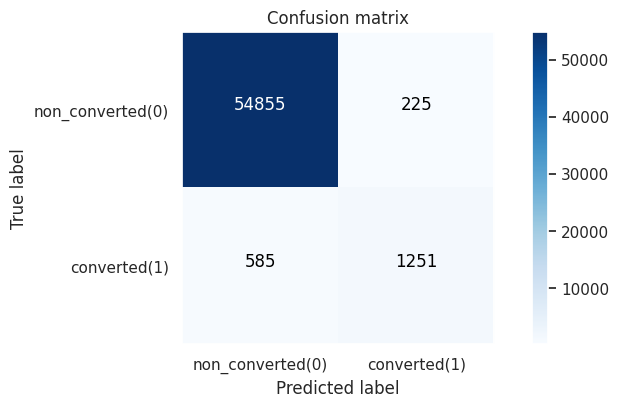

In [31]:
pred_test  = baseline.predict(X_test)
# Plotting the confusion metrics
cm = confusion_matrix(Y_test, pred_test)

plt.figure(figsize = (8,4), dpi = 100)
sns.set(rc = {'axes.grid' : False})
plot_confusion_matrix(cm, classes = ['non_converted(0)','converted(1)'])

### Oversampling - SMOTE method:

In [ ]:
#balancing using SMOTE method
smote = SMOTE(sampling_strategy='minority')
X_sm, y_sm = smote.fit_resample(X_train.astype('float'), Y_train)

pd.DataFrame(y_sm).value_counts()

0    220334
1    220334
Name: count, dtype: int64

In [ ]:
#train test split
X_train, X_test, y_train, y_test = train_test_split(X_sm, y_sm, test_size=0.3, random_state=42, stratify=y_sm)
pd.DataFrame(y_train).value_counts()

1    154234
0    154233
Name: count, dtype: int64

In [ ]:
#implementing logistic regression
lr = LogisticRegression(random_state=42)
#creating model
model = lr.fit(X_train, y_train)
y_train_pred = model.predict(X_train)
y_train_pred

array([0, 0, 1, ..., 1, 0, 0])

In [ ]:
#renaming X_test and y_test variables
test_input = X_test.copy()
test_output = y_test.copy()

pd.DataFrame(test_output).value_counts(normalize=True)

0    0.500004
1    0.499996
Name: proportion, dtype: float64

In [ ]:
test_pred = model.predict(test_input)
test_pred

array([0, 1, 0, ..., 0, 0, 0])

In [ ]:
#printing classification report
print(classification_report(test_output, test_pred))

              precision    recall  f1-score   support

           0       0.93      0.94      0.93     66101
           1       0.94      0.93      0.93     66100

    accuracy                           0.93    132201
   macro avg       0.93      0.93      0.93    132201
weighted avg       0.93      0.93      0.93    132201



In [ ]:
#evaluating the model
model_name = 'Logistic Regression - SMOTE'
train_score = model.score(X_train,y_train)
test_score = model.score(X_test,y_test)

acc_score = accuracy_score(test_output,test_pred)
f_score = f1_score(test_output, test_pred, average='weighted')
precision = precision_score(test_output, test_pred)
recall = metrics.recall_score(test_output,test_pred)

# adding claculations to dataframe
model_eval_data = pd.DataFrame([[model_name, train_score, test_score, acc_score, f_score, precision, recall]], 
                               columns=['Model Name', 'Training Score', 'Testing Score', 'Accuracy', 'F1 Score', 'Precision', 'Recall'])


evaluate_df = pd.concat([evaluate_df, model_eval_data], ignore_index=True)

evaluate_df

,Model Name,Training Score,Testing Score,Accuracy,F1 Score,Precision,Recall
0,Logistic Regression - without balancing,0.985224,0.985031,0.985031,0.740085,0.849440,0.655676
1,Logistic Regression - SMOTE,0.932479,0.933374,0.933374,0.933373,0.936637,0.929637


Confusion matrix, without normalization


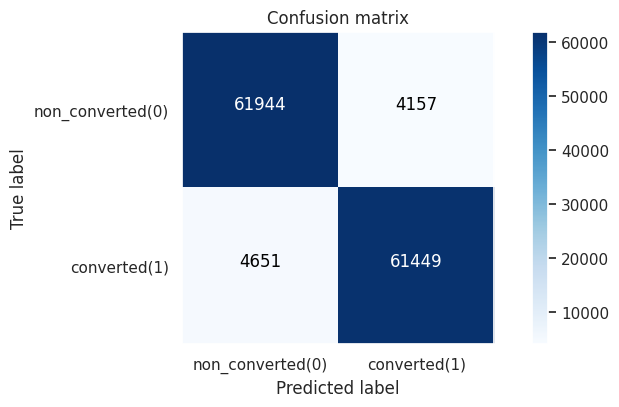

In [ ]:
pred_test  = lr.predict(X_test)
# Plotting the confusion metrics
cm = confusion_matrix(y_test, test_pred)

plt.figure(figsize = (8,4), dpi = 100)
sns.set(rc = {'axes.grid' : False})
plot_confusion_matrix(cm, classes = ['non_converted(0)','converted(1)'])

### Random Forest Classifier Oversampling - SMOTE:

In [ ]:
#train-test split
X_train, X_test, y_train, y_test = train_test_split(X_sm,y_sm, test_size=0.3, random_state=42)

rf = RandomForestClassifier(n_estimators=100, criterion='gini')

model = rf.fit(X_train,y_train)

test_pred = model.predict(test_input)

print(classification_report(test_output, test_pred))

#evaluating the model
model_name = 'Random Forest - SMOTE'
train_score = model.score(X_train,y_train)
test_score = model.score(X_test,y_test)

acc_score = accuracy_score(test_output,test_pred)
f_score = f1_score(test_output, test_pred, average='weighted')
precision = precision_score(test_output, test_pred)
recall = metrics.recall_score(test_output,test_pred)

# adding claculations to dataframe
model_eval_data = pd.DataFrame([[model_name, train_score, test_score, acc_score, f_score, precision, recall]], 
                               columns=['Model Name', 'Training Score', 'Testing Score', 'Accuracy', 'F1 Score', 'Precision', 'Recall'])


evaluate_df = pd.concat([evaluate_df, model_eval_data], ignore_index=True)

evaluate_df

              precision    recall  f1-score   support

           0       0.97      0.94      0.96     66101
           1       0.95      0.97      0.96     66100

    accuracy                           0.96    132201
   macro avg       0.96      0.96      0.96    132201
weighted avg       0.96      0.96      0.96    132201



,Model Name,Training Score,Testing Score,Accuracy,F1 Score,Precision,Recall
0,Logistic Regression - without balancing,0.985224,0.985031,0.985031,0.740085,0.849440,0.655676
1,Logistic Regression - SMOTE,0.932479,0.933374,0.933374,0.933373,0.936637,0.929637
2,Random Forest - SMOTE,0.956430,0.954040,0.956468,0.956462,0.945791,0.968442


Confusion matrix, without normalization


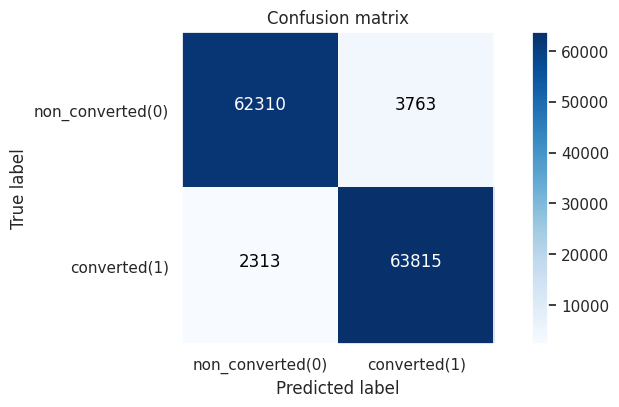

In [ ]:
pred_test  = model.predict(X_test)
# Plotting the confusion metrics
cm = confusion_matrix(y_test, pred_test)

plt.figure(figsize = (8,4), dpi = 100)
sns.set(rc = {'axes.grid' : False})
plot_confusion_matrix(cm, classes = ['non_converted(0)','converted(1)'])


### Hyper-parameter Tuning for Random Forest:

In [ ]:
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 50, stop = 200, num = 4)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 50, num = 5)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]

# Create the random grid
grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf
              }

print(grid)

{'n_estimators': [50, 100, 150, 200], 'max_features': ['auto', 'sqrt'], 'max_depth': [10, 20, 30, 40, 50, None], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4]}


In [ ]:
best_grid = RandomForestClassifier(max_features = 'sqrt', n_estimators=200, random_state=42)
#train-test split
X_train, X_test, y_train, y_test = train_test_split(X_sm,y_sm, test_size=0.3, random_state=42)

model = best_grid.fit(X_train,y_train)

test_pred = model.predict(test_input)

print(classification_report(test_output, test_pred))

#evaluating the model
model_name = 'Random Forest - SMOTE [Hyperparameter Tuned]'
train_score = model.score(X_train,y_train)
test_score = model.score(X_test,y_test)

acc_score = accuracy_score(test_output,test_pred)
f_score = f1_score(test_output, test_pred, average='weighted')
precision = precision_score(test_output, test_pred)
recall = metrics.recall_score(test_output,test_pred)

# adding claculations to dataframe
model_eval_data = pd.DataFrame([[model_name, train_score, test_score, acc_score, f_score, precision, recall]], 
                               columns=['Model Name', 'Training Score', 'Testing Score', 'Accuracy', 'F1 Score', 'Precision', 'Recall'])


evaluate_df = pd.concat([evaluate_df, model_eval_data], ignore_index=True)

evaluate_df

              precision    recall  f1-score   support

           0       0.97      0.94      0.96     66101
           1       0.95      0.97      0.96     66100

    accuracy                           0.96    132201
   macro avg       0.96      0.96      0.96    132201
weighted avg       0.96      0.96      0.96    132201



,Model Name,Training Score,Testing Score,Accuracy,F1 Score,Precision,Recall
0,Logistic Regression - without balancing,0.985224,0.985031,0.985031,0.740085,0.849440,0.655676
1,Logistic Regression - SMOTE,0.932479,0.933374,0.933374,0.933373,0.936637,0.929637
2,Random Forest - SMOTE,0.956430,0.954040,0.956468,0.956462,0.945791,0.968442
3,Random Forest - SMOTE [Hyperparameter Tuned],0.956430,0.954032,0.956468,0.956462,0.945791,0.968442


Confusion matrix, without normalization


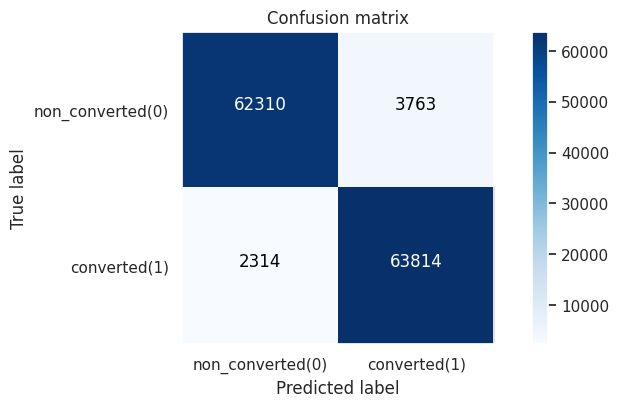

In [ ]:
pred_test  = model.predict(X_test)
# Plotting the confusion metrics
cm = confusion_matrix(y_test, pred_test)

plt.figure(figsize = (8,4), dpi = 100)
sns.set(rc = {'axes.grid' : False})
plot_confusion_matrix(cm, classes = ['non_converted(0)','converted(1)'])

# Train best classifier on all data and use it to make predictions on X_without_labels
**Before making predictions on the file conversion_data_test.csv, let's train our model on ALL the data that was in conversion_data_train.csv. Sometimes, this allows to make tiny improvements in the score because we're using more examples to train the model.**

In [ ]:
# Concatenate our train and test set to train your best classifier on all data with labels
X = np.append(X_train,X_test,axis=0)
Y = np.append(y_train,y_test)

model.fit(X,Y)

RandomForestClassifier(n_estimators=200, random_state=42)

In [ ]:
# Read data without labels
data_without_labels = pd.read_csv('conversion_data_test.csv')
print('Prediction set (without labels) :', data_without_labels.shape)

# Warning : check consistency of features_list (must be the same than the features 
# used by your best classifier)
features_list = ['total_pages_visited', 'new_user', 'age']
X_without_labels = data_without_labels.loc[:, features_list]

# Convert pandas DataFrames to numpy arrays before using scikit-learn
print("Convert pandas DataFrames to numpy arrays...")
X_without_labels = X_without_labels.values
print("...Done")

print(X_without_labels[0:5,:])

Prediction set (without labels) : (31620, 5)
Convert pandas DataFrames to numpy arrays...
...Done
[[16  0 28]
 [ 5  1 22]
 [ 1  1 32]
 [ 6  1 32]
 [ 3  0 25]]


In [ ]:
# WARNING : PUT HERE THE SAME PREPROCESSING AS FOR YOUR TEST SET
# CHECK YOU ARE USING X_without_labels
print("Encoding categorical features and standardizing numerical features...")

X_without_labels = featureencoder.transform(X_without_labels)
print("...Done")
print(X_without_labels[0:5,:])

Encoding categorical features and standardizing numerical features...
...Done
[[ 3.32677112 -1.47737706 -0.3112874 ]
 [ 0.03803388  0.67687527 -1.03716308]
 [-1.15787057  0.67687527  0.17262971]
 [ 0.33701     0.67687527  0.17262971]
 [-0.55991834 -1.47737706 -0.67422524]]


In [ ]:
# Make predictions and dump to file
# WARNING : MAKE SURE THE FILE IS A CSV WITH ONE COLUMN NAMED 'converted' AND NO INDEX !
# WARNING : FILE NAME MUST HAVE FORMAT 'conversion_data_test_predictions_[name].csv'
# where [name] is the name of your team/model separated by a '-'
# For example : [name] = AURELIE-model1
data = {
    'converted': model.predict(X_without_labels)
}

Y_predictions = pd.DataFrame(columns=['converted'],data=data)
Y_predictions.to_csv('conversion_data_test_predictions_KAMILA-model.csv', index=False)
